In [1]:
# !pip install -q taker kaleido circuitsvis hqq plotly scikit-learn
# Standard library imports
import json
from datetime import datetime
from os import listdir
from os.path import exists

# Third-party imports
import circuitsvis as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import phate
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns
import torch
import umap
from plotly.subplots import make_subplots
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_distances
from sklearn.preprocessing import StandardScaler
from taker import Model
from taker.hooks import HookConfig

/workspace/SPAR/interp-ab/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
m = Model("google/gemma-2-9b-it", dtype="hqq8", device_map="cuda")
m.show_details()

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

Loaded model 'google/gemma-2-9b-it' with hqq8:
- Added 672 hooks across 42 layers
 - n_layers : 42
 - d_model  : 3584
 - n_heads  : 16
 - d_head   : 256
 - d_mlp    : 14336


# Import and Embed text

In [2]:
filepath = "../data/latest_transferred_generation.jsonl"
results_df = pd.read_json(filepath, lines=True)
baselinefile = "../data/latest_orig_generation.jsonl"
base_df = pd.read_json(baselinefile, lines=True)
neutralfile0 = "../data/latest_neutral0_generation.jsonl"
neutral_df0 = pd.read_json(neutralfile0, lines=True)
neutralfile1 = "../data/latest_neutral1_generation.jsonl"
neutral_df1 = pd.read_json(neutralfile1, lines=True)
neutralfile2 = "../data/latest_neutral2_generation.jsonl"
neutral_df2 = pd.read_json(neutralfile2, lines=True)
allneutrals = [neutral_df0, neutral_df1, neutral_df2]
neutral_dflist = pd.concat(allneutrals, ignore_index=True, sort=False)
def split_at_double_newline(text):
    # Ensure we are only working with strings longer than 15 characters
    if len(text) > 15:
        # Search for the first double newline after the 5th character
        pos = text.find('\n\n', 5)
        if pos != -1:  # Check if double newline was found
            return text[:pos], text[pos+2:]  # Split and remove the newline from the second part
        print("none")
    return None, text  # If no split is required, return the original text and None
_ , base_df['para2'] = zip(*base_df['output'].apply(split_at_double_newline))
base_df['output'] = base_df['para2'].copy()
neutral_dflist['output'] = neutral_dflist['prompt'].str[2:] + neutral_dflist['output'] #need to do this with the string
total_df = pd.concat([results_df, base_df, neutral_dflist], ignore_index=True, sort=False)
total_df["init_prompt"] = total_df['orig_prompt'].where(total_df['prompt'].isna(), total_df['prompt'])
for j in range(2000, 2000+len(allneutrals*1000), 1000):
    for i in range(1000):
        var = int(j+i)
        total_df["output"][var] = total_df["output"][var][:len(total_df["output"][i])]
total_df["cheat_tokens"]  = total_df["cheat_tokens"].fillna(-1).astype(int).astype(str).replace('-1', np.nan)
total_df["type-extended"] = total_df['type'].where(total_df['type']!="neutral", "neutral"+total_df['cheat_tokens'])


/tmp/ipykernel_1227639/4256764190.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_df["output"][var] = total_df["output"][var][:len(total_df["output"][i])]


In [3]:
sentenceTransformer = SentenceTransformer("all-mpnet-base-v2")

embeddings = sentenceTransformer.encode(total_df['output'].to_list())
print(embeddings.shape)
total_df["embeddings"] = embeddings.tolist()
scaled_embeddings = StandardScaler().fit_transform(embeddings)
neutral_start = results_df.shape[0]+base_df.shape[0]
results_df["embeddings"] = embeddings[:1000].tolist()
base_df["embeddings"] = embeddings[1000:2000].tolist()
neutral_df0["embeddings"] = embeddings[2000:3000].tolist()
neutral_df1["embeddings"] = embeddings[3000:4000].tolist()
neutral_df2["embeddings"] = embeddings[4000:5000].tolist()
results_df["scaled_embeddings"] = scaled_embeddings[:1000].tolist()
base_df["scaled_embeddings"] = scaled_embeddings[1000:2000].tolist()
neutral_df0["scaled_embeddings"] = scaled_embeddings[2000:3000].tolist()
neutral_df1["scaled_embeddings"] = scaled_embeddings[3000:4000].tolist()
neutral_df2["scaled_embeddings"] = scaled_embeddings[4000:5000].tolist()
results_df.head()
print(results_df.shape)
print(base_df.shape)
#takes a short while

(5000, 768)
(1000, 11)
(1000, 10)


# TSNE

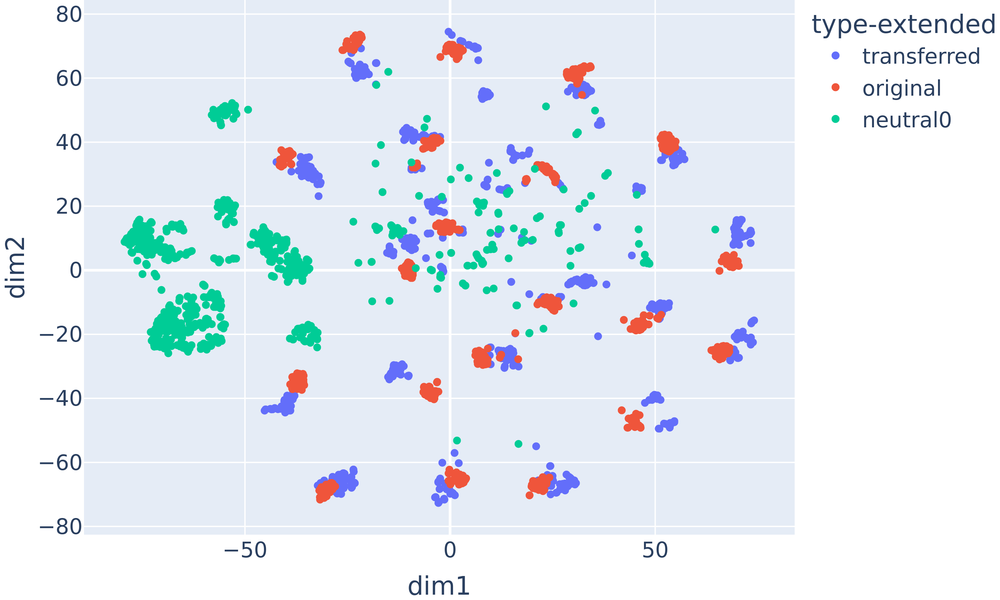

In [20]:

reducer = TSNE(n_components=2)
tsne_embeddings_reduced = reducer.fit_transform(embeddings)


total_df["tsnedim1"] = tsne_embeddings_reduced[:, 0]
total_df["tsnedim2"] = tsne_embeddings_reduced[:, 1]

total_df["truncated_output"] = total_df["output"].str.slice(0,25)
mini_df = total_df[
    (total_df["type-extended"] == "transferred") |
    (total_df["type-extended"] == "original") |
    (total_df["type-extended"] == "neutral0")
]

fig = px.scatter(
    mini_df,
    x="tsnedim1",
    y="tsnedim2",
    labels={
            "tsnedim1": "dim1",
            "tsnedim2": "dim2"
            },
    hover_data=["type-extended", "init_prompt", "transplant_prompt", "truncated_output"],
    color="type-extended",

    # category_orders={"type":["neutral","original","transferred"]}

)

# fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=100, xref="container"))

fig.update_traces(
    hovertemplate="<br>".join(
        ["Type: %{customdata[0]}", "Orig Prompt: %{customdata[1]}", "Transplanted Prompt: %{customdata[2]}", "Output: %{customdata[3]}"]
    )
)

fig.update_layout(margin=dict(l=0, r=0, t=0, b=0), font_size=16)
fig.show()
pio.write_image(fig, "tsnehighresallneutral.png", format="png", width = 750, height= 450, scale=4)


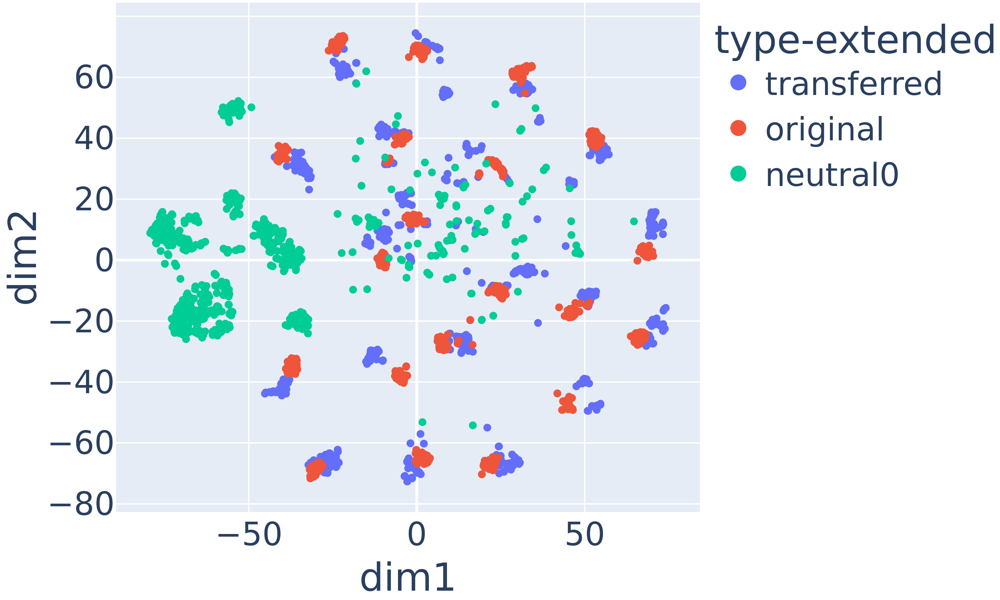

In [21]:
fig.update_layout(font_size=24)
fig.update_layout(legend= {'itemsizing': 'constant'})
fig.show()
pio.write_image(fig, "tsnehighres.png", format="png", width = 750, height= 450, scale=4)


# PHATE

Calculating PHATE...
  Running PHATE on 5000 observations and 768 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.77 seconds.
    Calculating KNN search...
    Calculated KNN search in 1.15 seconds.
    Calculating affinities...


/workspace/SPAR/interp-ab/.venv/lib/python3.10/site-packages/graphtools/graphs.py:290: RuntimeWarning:

Detected zero distance between 26 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.



    Calculated affinities in 1.37 seconds.
  Calculated graph and diffusion operator in 3.35 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 2.85 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.39 seconds.
  Calculated landmark operator in 7.64 seconds.
  Calculating optimal t...
    Automatically selected t = 18
  Calculated optimal t in 0.84 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.56 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.76 seconds.
Calculated PHATE in 15.15 seconds.


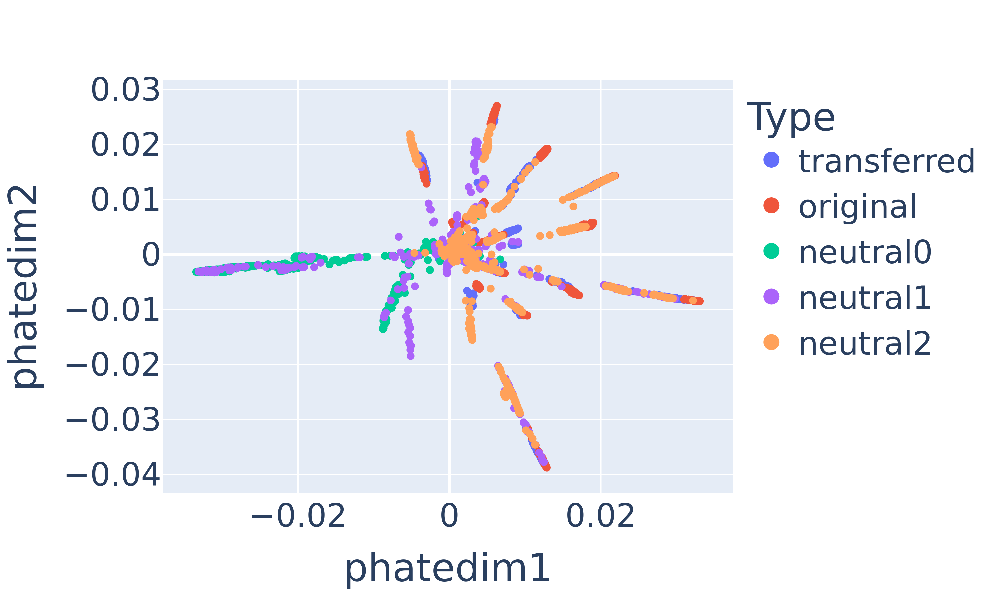

In [24]:
phate_op = phate.PHATE(knn=5, decay=5)
# phate_op = phate.PHATE()
data_phate = phate_op.fit_transform(embeddings)

total_df["phatedim1"] = data_phate[:, 0]
total_df["phatedim2"] = data_phate[:, 1]


total_df["truncated_output"] = total_df["output"].str.slice(0,50)
mini_df = total_df[
    (total_df["type-extended"] == "transferred") |
    (total_df["type-extended"] == "original") |
    (total_df["type-extended"] == "neutral0") |
    (total_df["type-extended"] == "neutral1") |
    (total_df["type-extended"] == "neutral2")
]

fig = px.scatter(
    mini_df,
    x="phatedim1",
    y="phatedim2",
    hover_data=["type-extended", "init_prompt", "transplant_prompt", "truncated_output"],
    # title="PHATE of Story Embeddings",
    color="type-extended",
    # category_orders={"type":["neutral","original","transferred"]}

)

# fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=100, xref="container"))

fig.update_traces(
    hovertemplate="<br>".join(
        ["Type: %{customdata[0]}", "Orig Prompt: %{customdata[1]}", "Transplanted Prompt: %{customdata[2]}", "Output: %{customdata[3]}"]
    )
)

fig.update_layout(font_size=24)
fig.update_layout(legend= {'itemsizing': 'constant'})
# set legend title to "Type"
fig.update_layout(legend_title="Type")
# fig.show()
pio.write_image(fig, "phate-highres-2.png", format="png", width = 750, height= 450, scale=4)
fig.show()


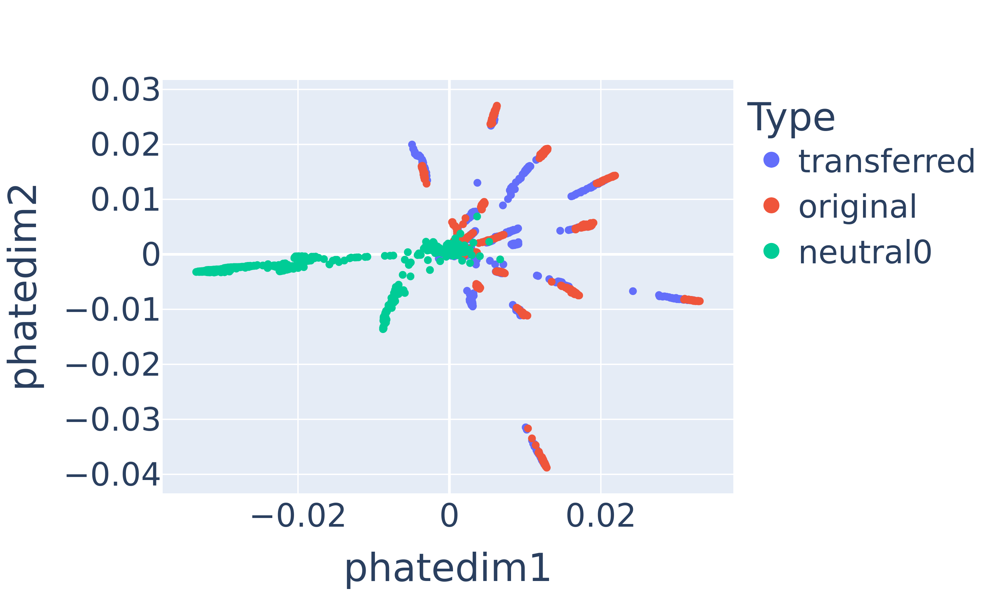

In [25]:

mini_df = total_df[
    (total_df["type-extended"] == "transferred") |
    (total_df["type-extended"] == "original") |
    (total_df["type-extended"] == "neutral0")
    # (total_df["type-extended"] == "neutral1") |
    # (total_df["type-extended"] == "neutral2")
]

fig = px.scatter(
    mini_df,
    x="phatedim1",
    y="phatedim2",
    hover_data=["type-extended", "init_prompt", "transplant_prompt", "truncated_output"],
    # title="PHATE of Story Embeddings",
    color="type-extended",
    # category_orders={"type":["neutral","original","transferred"]}

)

# fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=100, xref="container"))

fig.update_traces(
    hovertemplate="<br>".join(
        ["Type: %{customdata[0]}", "Orig Prompt: %{customdata[1]}", "Transplanted Prompt: %{customdata[2]}", "Output: %{customdata[3]}"]
    )
)

fig.update_layout(font_size=24)
fig.update_layout(legend= {'itemsizing': 'constant'})
# set legend title to "Type"
fig.update_layout(legend_title="Type")
# fig.show()
pio.write_image(fig, "phate-highres-0.png", format="png", width = 750, height= 450, scale=4)
fig.show()


# Violin Plots

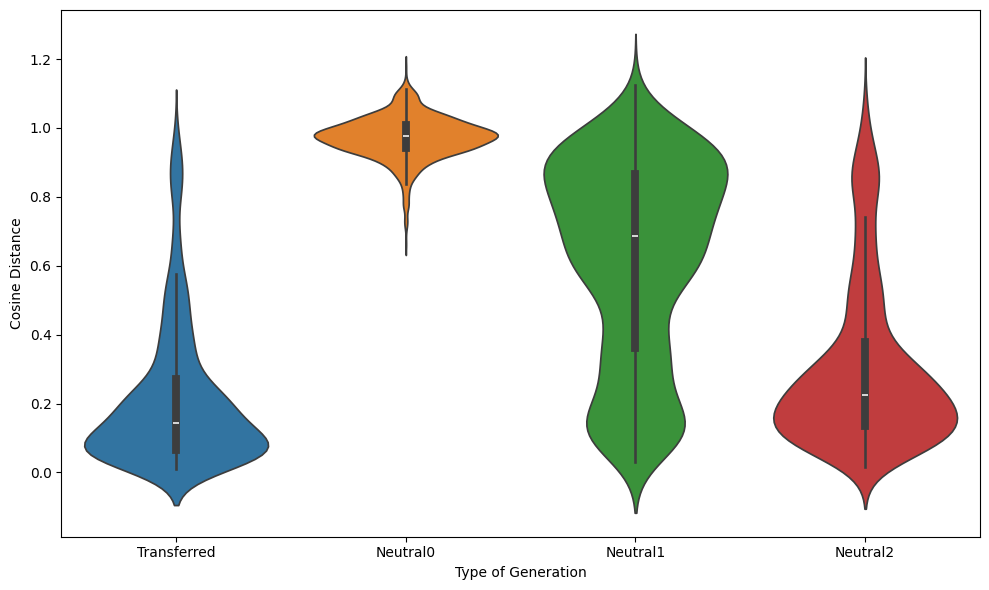

In [14]:
df1 = base_df
df2 = results_df
df3 = neutral_df0
df4 = neutral_df1
df5 = neutral_df2


dfs = [df1, df2, df3, df4, df5]


embeddings_list = [torch.tensor(df['embeddings'].tolist()) for df in dfs]

cosine_distances_list = []
comparison_labels = ['Transferred', 'Neutral0', 'Neutral1', 'Neutral2']
for i in range(1, len(embeddings_list)):
    cos = torch.nn.CosineSimilarity(dim=1)
    cossim = cos(embeddings_list[0], embeddings_list[i])
    cosdist = 1 - cossim
    cosine_distances_list.append(cosdist.tolist())

violin_data = pd.DataFrame({
    'Cosine Distance': [dist for sublist in cosine_distances_list for dist in sublist],
    'Type of Generation': [comparison_labels[i] for i, sublist in enumerate(cosine_distances_list) for _ in sublist]
})

plt.figure(figsize=(10, 6))
sns.violinplot(x='Type of Generation', y='Cosine Distance', data=violin_data, hue="Type of Generation")
plt.tight_layout()
sns.set_theme(font_scale=1.9)
plt.savefig('cosine_distances_violin_plot.png', dpi=600)

plt.show()
